In [4]:
import pandas as pd
import numpy as np

In [5]:
rep_table=pd.read_csv("replication_Koren_Table.txt",sep="\t",dtype={'POS': np.int64})

In [6]:
rep_table

,CHR,POS,REP_Z
0,chr1,150,0.117903
1,chr1,275,0.117110
2,chr1,501,0.115675
3,chr1,4752,0.088693
4,chr1,6158,0.079770
5,chr1,7266,0.072738
6,chr1,10146,0.054466
7,chr1,37048,-0.115575
8,chr1,44296,-0.161089
9,chr1,46295,-0.173614


In [7]:
end=[]
for p in rep_table["POS"]:
    end.append(p+1)

In [8]:
rep_table["END"]=end

In [21]:
rep_table.to_csv("replication_Koren_Table.bed",sep="\t",columns=["CHR","POS","END","REP_Z"],header=False,na_rep='NaN')

In [22]:
made=pd.read_csv("replication_Koren_Table.bed",sep="\t")

In [20]:
made

,0,chr1,150,151,0.117903
0,1,chr1,275,276,0.117110
1,2,chr1,501,502,0.115675
2,3,chr1,4752,4753,0.088693
3,4,chr1,6158,6159,0.079770
4,5,chr1,7266,7267,0.072738
5,6,chr1,10146,10147,0.054466
6,7,chr1,37048,37049,-0.115575
7,8,chr1,44296,44297,-0.161089
8,9,chr1,46295,46296,-0.173614
9,10,chr1,49216,49217,-0.191894


In [9]:
import pandas as pd

with open("RT_BG01_NPC_Int84203916_hg38.bedgraph","r") as n1, open("RT_BG01_NPC_Int70021030_hg38.bedgraph") as n2, open("RT_BG01_NPC_Int93941761_hg38.bedgraph") as n3:
    n1_df=pd.read_csv(n1,skiprows=11,header=None,names=["Chr","start","end","rep_time"],sep="\t")
    n2_df=pd.read_csv(n2,skiprows=11,header=None,names=["Chr","start","end","rep_time"],sep="\t")
    n3_df=pd.read_csv(n3,skiprows=11,header=None,names=["Chr","start","end","rep_time"],sep="\t")
    list_of_tuples=list(zip(n1_df['rep_time'],n2_df['rep_time'],n3_df['rep_time']))   
    df=pd.DataFrame(list_of_tuples,columns=['rep1', 'rep2', 'rep3'])
    df=df.assign(mean=df.mean(axis=1))
    final=list(zip(n1_df["Chr"],n1_df["start"],n1_df["end"],df["mean"]))
    f_df=pd.DataFrame(final,columns=["Chr","start","end","mean_Z"])
    sort_df=f_df.sort_values("Chr")
    sort_df.to_csv("RT_BG01_NPC_AvgZ_hg38.bedgraph",sep="\t",)
    

In [10]:
sort_df

,Chr,start,end,mean_Z
720186,chr1,27918,27977,0.331671
834618,chr1,175534617,175534676,-0.610176
834619,chr1,175536017,175536076,-0.611645
834620,chr1,175536745,175536804,-0.612395
834621,chr1,175537908,175537967,-0.613585
834622,chr1,175539811,175539870,-0.615534
834623,chr1,175540144,175540203,-0.615878
834624,chr1,175541640,175541699,-0.617450
834617,chr1,175533886,175533945,-0.609390
834625,chr1,175542502,175542561,-0.618381


In [8]:
import json
with open("RT_BG01_NPC_AvgZ_hg38.ann.csv","r") as rr:
    rep_d=json.load(rr)

In [10]:
filter_nan={}
for chromosome in rep_d:
    for rep_site in rep_d[chromosome]:
        if "nan" not in rep_site:
            if chromosome not in filter_nan:
                filter_nan[chromosome]=[rep_site]
            else:
                rep_sites=filter_nan[chromosome]
                rep_sites.append(rep_site)
                filter_nan[chromosome]=rep_sites               

In [3]:
filter_nan["chr1"]

[['chr1', 175534617, 175534676, -0.6101756666666667, 'ENSG00000116147'],
 ['chr1', 175536017, 175536076, -0.6116446666666666, 'ENSG00000116147'],
 ['chr1', 175536745, 175536804, -0.6123953333333333, 'ENSG00000116147'],
 ['chr1', 175537908, 175537967, -0.613585, 'ENSG00000116147'],
 ['chr1', 175539811, 175539870, -0.6155336666666666, 'ENSG00000116147'],
 ['chr1', 175540144, 175540203, -0.615878, 'ENSG00000116147'],
 ['chr1', 175541640, 175541699, -0.6174496666666667, 'ENSG00000116147'],
 ['chr1', 175533886, 175533945, -0.60939, 'ENSG00000116147'],
 ['chr1', 175542502, 175542561, -0.618381, 'ENSG00000116147'],
 ['chr1', 175544891, 175544950, -0.621104, 'ENSG00000116147'],
 ['chr1', 175546393, 175546452, -0.622958, 'ENSG00000116147'],
 ['chr1', 175547360, 175547419, -0.6242233333333334, 'ENSG00000116147'],
 ['chr1', 175548795, 175548854, -0.6260220000000001, 'ENSG00000116147'],
 ['chr1', 175549471, 175549530, -0.6267866666666667, 'ENSG00000116147'],
 ['chr1', 175550373, 175550432, -0.6277

In [7]:
list_chr=["chr"+str(num) for num in range(1,23)]
list_chr.extend(["chrX","chrY"]) 
list_chr

['chr1',
 'chr2',
 'chr3',
 'chr4',
 'chr5',
 'chr6',
 'chr7',
 'chr8',
 'chr9',
 'chr10',
 'chr11',
 'chr12',
 'chr13',
 'chr14',
 'chr15',
 'chr16',
 'chr17',
 'chr18',
 'chr19',
 'chr20',
 'chr21',
 'chr22',
 'chrX',
 'chrY']

In [1]:
import json
with open("RT_BG01_NPC_AvgZ_hg38.ann.csv","r") as rr:
    di=json.load(rr)
    print(di["chr1"])

[['chr1', 27918, 27977, 0.33167066666666667, 'nan'], ['chr1', 175534617, 175534676, -0.6101756666666667, 'ENSG00000116147'], ['chr1', 175536017, 175536076, -0.6116446666666666, 'ENSG00000116147'], ['chr1', 175536745, 175536804, -0.6123953333333333, 'ENSG00000116147'], ['chr1', 175537908, 175537967, -0.613585, 'ENSG00000116147'], ['chr1', 175539811, 175539870, -0.6155336666666666, 'ENSG00000116147'], ['chr1', 175540144, 175540203, -0.615878, 'ENSG00000116147'], ['chr1', 175541640, 175541699, -0.6174496666666667, 'ENSG00000116147'], ['chr1', 175533886, 175533945, -0.60939, 'ENSG00000116147'], ['chr1', 175542502, 175542561, -0.618381, 'ENSG00000116147'], ['chr1', 175544891, 175544950, -0.621104, 'ENSG00000116147'], ['chr1', 175546393, 175546452, -0.622958, 'ENSG00000116147'], ['chr1', 175547360, 175547419, -0.6242233333333334, 'ENSG00000116147'], ['chr1', 175548795, 175548854, -0.6260220000000001, 'ENSG00000116147'], ['chr1', 175549471, 175549530, -0.6267866666666667, 'ENSG00000116147'], 

In [11]:
with open("RT_BG01_NPC_AvgZ_hg38.ann.json","w") as wr:
    json.dump(filter_nan,wr,indent=4)

In [4]:
with open("RT_BG01_NPC_AvgZ_hg38.ann.json","r") as rr:
    dic=json.load(rr)

In [5]:
list(dic.keys())

['chr1',
 'chr10',
 'chr11',
 'chr12',
 'chr13',
 'chr14',
 'chr15',
 'chr16',
 'chr17',
 'chr18',
 'chr19',
 'chr2',
 'chr20',
 'chr21',
 'chr22',
 'chr3',
 'chr4',
 'chr5',
 'chr6',
 'chr7',
 'chr8',
 'chr9',
 'chrX',
 'chrY']

In [12]:
data = pd.DataFrame.from_dict(filter_nan, orient='index')

In [13]:
data

,0,1,2,3,4,5,6,7,8,9,...,92036,92037,92038,92039,92040,92041,92042,92043,92044,92045
chr1,"[chr1, 175534617, 175534676, -0.61017566666666...","[chr1, 175536017, 175536076, -0.61164466666666...","[chr1, 175536745, 175536804, -0.61239533333333...","[chr1, 175537908, 175537967, -0.613585, ENSG00...","[chr1, 175539811, 175539870, -0.61553366666666...","[chr1, 175540144, 175540203, -0.615878, ENSG00...","[chr1, 175541640, 175541699, -0.61744966666666...","[chr1, 175533886, 175533945, -0.60939, ENSG000...","[chr1, 175542502, 175542561, -0.618381, ENSG00...","[chr1, 175544891, 175544950, -0.621104, ENSG00...",...,"[chr1, 75226550, 75226609, -0.645108, ENSG0000...","[chr1, 75227758, 75227817, -0.643983, ENSG0000...","[chr1, 75229250, 75229309, -0.6425576666666667...","[chr1, 75209857, 75209916, -0.660409, ENSG0000...","[chr1, 75208696, 75208755, -0.6616283333333333...","[chr1, 75206685, 75206744, -0.6637643333333333...","[chr1, 75203192, 75203251, -0.6674343333333334...","[chr1, 75204055, 75204114, -0.666531, ENSG0000...","[chr1, 75205476, 75205535, -0.6650393333333334...","[chr1, 75207128, 75207187, -0.6632956666666666..."
chr10,"[chr10, 28068724, 28068783, -0.434774, ENSG000...","[chr10, 76539670, 76539729, -0.564026, ENSG000...","[chr10, 76539095, 76539154, -0.564192, ENSG000...","[chr10, 76537358, 76537417, -0.564783, ENSG000...","[chr10, 76536647, 76536706, -0.565060333333333...","[chr10, 76535393, 76535452, -0.565596, ENSG000...","[chr10, 76534452, 76534511, -0.566033, ENSG000...","[chr10, 76532898, 76532957, -0.566811333333333...","[chr10, 76540982, 76541041, -0.563645666666666...","[chr10, 76532453, 76532512, -0.567045666666666...",...,None,None,None,None,None,None,None,None,None,None
chr11,"[chr11, 67171311, 67171370, 1.2254333333333334...","[chr11, 67138201, 67138260, 1.1666166666666666...","[chr11, 67137038, 67137097, 1.1628100000000001...","[chr11, 67135848, 67135907, 1.1587733333333332...","[chr11, 67165944, 67166003, 1.2145733333333333...","[chr11, 67135446, 67135505, 1.1573833333333332...","[chr11, 67126761, 67126820, 1.1263906666666665...","[chr11, 67132734, 67132793, 1.1477633333333335...","[chr11, 67132137, 67132196, 1.1456093333333333...","[chr11, 67130480, 67130539, 1.1396123333333332...",...,None,None,None,None,None,None,None,None,None,None
chr12,"[chr12, 123525849, 123525908, 0.886561, ENSG00...","[chr12, 33395423, 33395482, -0.821498000000000...","[chr12, 33396060, 33396119, -0.822053, ENSG000...","[chr12, 33397227, 33397286, -0.823017, ENSG000...","[chr12, 33398779, 33398838, -0.824199, ENSG000...","[chr12, 33399779, 33399838, -0.824904666666666...","[chr12, 33400485, 33400544, -0.825378333333333...","[chr12, 33402100, 33402159, -0.82639, ENSG0000...","[chr12, 33402926, 33402985, -0.826872666666666...","[chr12, 33404039, 33404098, -0.827488333333333...",...,None,None,None,None,None,None,None,None,None,None
chr13,"[chr13, 83878366, 83878425, -1.076636666666666...","[chr13, 83881462, 83881521, -1.074192666666666...","[chr13, 83880192, 83880251, -1.075198333333333...","[chr13, 83879471, 83879530, -1.075765333333333...","[chr13, 79535389, 79535448, 0.996388, ENSG0000...","[chr13, 79533912, 79533971, 0.9909823333333333...","[chr13, 79533216, 79533275, 0.9884676666666667...","[chr13, 79529840, 79529899, 0.976607, ENSG0000...","[chr13, 79529048, 79529107, 0.973912, ENSG0000...","[chr13, 79526780, 79526839, 0.9664073333333333...",...,None,None,None,None,None,None,None,None,None,None
chr14,"[chr14, 41901988, 41902047, -1.17307, ENSG0000...","[chr14, 41900913, 41900972, -1.17341, ENSG0000...","[chr14, 41899916, 41899975, -1.17374, ENSG0000...","[chr14, 41899280, 41899339, -1.17395, ENSG0000...","[chr14, 41897864, 41897923, -1.174450000000000...","[chr14, 41894788, 41894847, -1.175613333333333...","[chr14, 41893885, 41893944, -1.175976666666666...","[chr14, 41891835, 41891894, -1.176846666666666...","[chr14, 41891240, 41891299, -1.177113333333333...","[chr14, 41858148, 41858207, -1.20642, ENSG0000...",...,None,None,None,N

In [37]:
id_dic={}
for chrom in filter_nan:
    for gene in filter_nan[chrom]:
        if gene != None:
            dic={"chr":gene[0],
                 "start":gene[1],
                 "end":gene[2],
                 "z_score":gene[3],
                 "gene_id":gene[4]}
            if chrom not in id_dic:
                id_dic[chrom]=[dic]
            else:
                already=id_dic[chrom]
                already.append(dic) 
                id_dic[chrom]=already
id_dic["chr1"]                

[{'chr': 'chr1',
  'start': 175534617,
  'end': 175534676,
  'z_score': -0.6101756666666667,
  'gene_id': 'ENSG00000116147'},
 {'chr': 'chr1',
  'start': 175536017,
  'end': 175536076,
  'z_score': -0.6116446666666666,
  'gene_id': 'ENSG00000116147'},
 {'chr': 'chr1',
  'start': 175536745,
  'end': 175536804,
  'z_score': -0.6123953333333333,
  'gene_id': 'ENSG00000116147'},
 {'chr': 'chr1',
  'start': 175537908,
  'end': 175537967,
  'z_score': -0.613585,
  'gene_id': 'ENSG00000116147'},
 {'chr': 'chr1',
  'start': 175539811,
  'end': 175539870,
  'z_score': -0.6155336666666666,
  'gene_id': 'ENSG00000116147'},
 {'chr': 'chr1',
  'start': 175540144,
  'end': 175540203,
  'z_score': -0.615878,
  'gene_id': 'ENSG00000116147'},
 {'chr': 'chr1',
  'start': 175541640,
  'end': 175541699,
  'z_score': -0.6174496666666667,
  'gene_id': 'ENSG00000116147'},
 {'chr': 'chr1',
  'start': 175533886,
  'end': 175533945,
  'z_score': -0.60939,
  'gene_id': 'ENSG00000116147'},
 {'chr': 'chr1',
  'sta

In [49]:
gene_wise={}
for chromosome in id_dic:
    for rep_site in id_dic[chromosome]:
        rep_site_z=rep_site["z_score"]
        rep_site_gene_id=rep_site["gene_id"]
        rep_site_chr=rep_site["chr"]
        if rep_site_chr not in gene_wise:
            gene_wise[rep_site_chr]={rep_site_gene_id:[rep_site_z]}
        else:
            gene_z_dict=gene_wise[rep_site_chr]
            if rep_site_gene_id not in gene_z_dict:
                gene_z_dict[rep_site_gene_id]=[rep_site_z]
            else:    
                zscore=gene_z_dict[rep_site_gene_id]
                zscore.append(rep_site_z)
                gene_z_dict[rep_site_gene_id]=zscore
            gene_wise[rep_site_chr]=gene_z_dict    
     

In [50]:
gene_wise["chr1"]

{'ENSG00000116147': [-0.6101756666666667,
  -0.6116446666666666,
  -0.6123953333333333,
  -0.613585,
  -0.6155336666666666,
  -0.615878,
  -0.6174496666666667,
  -0.60939,
  -0.618381,
  -0.621104,
  -0.622958,
  -0.6242233333333334,
  -0.6260220000000001,
  -0.6267866666666667,
  -0.627732,
  -0.6288116666666667,
  -0.619645,
  -0.607701,
  -0.6065866666666667,
  -0.6050763333333333,
  -0.5728040000000001,
  -0.5748816666666667,
  -0.57642,
  -0.578976,
  -0.581144,
  -0.5831483333333334,
  -0.5856166666666667,
  -0.5869,
  -0.5894516666666667,
  -0.5917516666666667,
  -0.5939773333333335,
  -0.5954756666666666,
  -0.5970663333333334,
  -0.5997593333333334,
  -0.601483,
  -0.6024653333333334,
  -0.6044766666666668,
  -0.6299603333333333,
  -0.630738,
  -0.6315653333333333,
  -0.6322626666666666,
  -0.6446286666666667,
  -0.6444713333333334,
  -0.644273,
  -0.6441939999999999,
  -0.644103,
  -0.644069,
  -0.6442043333333334,
  -0.6442943333333333,
  -0.644846,
  -0.6454206666666668,
  

In [51]:
avg_chr_gene={}
for chromosome in gene_wise:
    for gene in gene_wise[chromosome]:
        z_scores=gene_wise[chromosome][gene]
        gene_avg=sum(z_scores)/float(len(z_scores))
        if chromosome not in avg_chr_gene:
            avg_chr_gene[chromosome]={gene:gene_avg}
        else:
            gene_avg_dic=avg_chr_gene[chromosome]
            gene_avg_dic[gene]=gene_avg
            avg_chr_gene[chromosome]=gene_avg_dic

In [52]:
avg_chr_gene["chr1"]

{'ENSG00000116147': -0.5257351552704401,
 'ENSG00000120332': 0.46018193333333335,
 'ENSG00000235750': 0.364006192911111,
 'ENSG00000116161': 0.32201078787878784,
 'ENSG00000120333': 0.32820166666666667,
 'ENSG00000152061': 0.26111573424549545,
 'ENSG00000116183': -0.9969590309597519,
 'ENSG00000143207': -0.8487873676975943,
 'ENSG00000076321': 1.1584713492063494,
 'ENSG00000285777': 1.1804039393939392,
 'ENSG00000183831': 1.1786005050505048,
 'ENSG00000162753': 1.1215721898148145,
 'ENSG00000232113': 1.1903816666666667,
 'ENSG00000120334': 1.1355226666666667,
 'ENSG00000135870': 1.001308370892019,
 'ENSG00000117601': 0.9942752499999998,
 'ENSG00000117593': 1.1009848717948716,
 'ENSG00000185278': 1.025342243589744,
 'ENSG00000117586': 0.8045008166666665,
 'ENSG00000120337': 0.2967041185185185,
 'ENSG00000117592': 1.0800684333333335,
 'ENSG00000203737': 0.0928515,
 'ENSG00000116191': 0.786998655629139,
 'ENSG00000116194': 0.7834370185185184,
 'ENSG00000143322': 0.7337485952380951,
 'ENSG

In [55]:
with open("RT_BG01_NPC_GeneAvgZ_hg38.ann.json","w") as gene_w:
    json.dump(avg_chr_gene,gene_w,indent=4,sort_keys=True)

In [2]:
import pandas as pd
with open("/Users/asmaimran/genes_map.csv","r") as map_r:
    gene_map_df=pd.read_csv(map_r,sep=",")

In [11]:
gene_map_df

,entrezgene_id,chromosome_name,ensembl_gene_id
0,NaN,MT,ENSG00000210049
1,NaN,MT,ENSG00000211459
2,NaN,MT,ENSG00000210077
3,NaN,MT,ENSG00000210082
4,NaN,MT,ENSG00000209082
5,4535.0,MT,ENSG00000198888
6,NaN,MT,ENSG00000210100
7,NaN,MT,ENSG00000210107
8,NaN,MT,ENSG00000210112
9,4536.0,MT,ENSG00000198763


gene_map_df.set_index('ensembl_gene_id').to_dict()

In [12]:
gene_map_dict=gene_map_df.set_index('ensembl_gene_id').to_dict()

In [13]:
gene_map_dict

{'entrezgene_id': {'ENSG00000210049': nan,
  'ENSG00000211459': nan,
  'ENSG00000210077': nan,
  'ENSG00000210082': nan,
  'ENSG00000209082': nan,
  'ENSG00000198888': 4535.0,
  'ENSG00000210100': nan,
  'ENSG00000210107': nan,
  'ENSG00000210112': nan,
  'ENSG00000198763': 4536.0,
  'ENSG00000210117': nan,
  'ENSG00000210127': nan,
  'ENSG00000210135': nan,
  'ENSG00000210140': nan,
  'ENSG00000210144': nan,
  'ENSG00000198804': 4512.0,
  'ENSG00000210151': 113219467.0,
  'ENSG00000210154': nan,
  'ENSG00000198712': 4513.0,
  'ENSG00000210156': nan,
  'ENSG00000228253': 4509.0,
  'ENSG00000198899': 4508.0,
  'ENSG00000198938': 4514.0,
  'ENSG00000210164': nan,
  'ENSG00000198840': 4537.0,
  'ENSG00000210174': nan,
  'ENSG00000212907': 4539.0,
  'ENSG00000198886': 4538.0,
  'ENSG00000210176': nan,
  'ENSG00000210184': nan,
  'ENSG00000210191': nan,
  'ENSG00000198786': 4540.0,
  'ENSG00000198695': 4541.0,
  'ENSG00000210194': nan,
  'ENSG00000198727': 4519.0,
  'ENSG00000210195': nan,


In [6]:
import json
with open("RT_BG01_NPC_GeneAvgZ_hg38.ann.json","r") as gene_w:
    avg_chr_gene=json.load(gene_w)

In [8]:
list_genes=[]
for chromosome in avg_chr_gene:
    list_genes.extend(avg_chr_gene[chromosome].keys())

In [9]:
list_genes[5]

'ENSG00000001461'

In [10]:
list_genes[0:5]

['ENSG00000000457',
 'ENSG00000000460',
 'ENSG00000000938',
 'ENSG00000000971',
 'ENSG00000001460']

In [25]:
development_genes={}
for gene in list_genes:
    development_genes[gene]=gene_map_dict["entrezgene_id"][gene]

ValueError: cannot convert float NaN to integer

In [31]:
with open("developement_genes.json","w") as dw:
    json.dump(development_genes,dw,indent=4,sort_keys=True)

In [28]:
import numpy as np
list(development_genes.values()).count("NaN")

0

In [93]:
mapped=gene_map_dict['entrezgene_id']
mapped_di={}
for chromosome in avg_chr_gene:
    gene_z_dic=avg_chr_gene[chromosome]
    for gene_ensembl in gene_z_dic:
        z_score=gene_z_dic[gene_ensembl]
        if chromosome not in mapped_di:
            mapped_di[chromosome]={gene_ensembl:[chromosome,mapped[gene_ensembl],z_score]}
        else:
            already=mapped_di[chromosome]
            already[gene_ensembl]=[chromosome,mapped[gene_ensembl],z_score]
            mapped_di[chromosome]=already  

In [45]:
print(mapped_di)

{'chr1': {57147.0: ['ENSG00000000457', -0.9837599259259258], 55732.0: ['ENSG00000000460', -0.9387113519813516], 2268.0: ['ENSG00000000938', 0.7768450555555555], 3075.0: ['ENSG00000000971', -0.760689202702703], 90529.0: ['ENSG00000001460', 1.2417352941176467], 57185.0: ['ENSG00000001461', 1.3183365333333337], 204.0: ['ENSG00000004455', 1.3792594047619047], 23028.0: ['ENSG00000004487', 1.4816152941176473], 55001.0: ['ENSG00000006555', 1.069926862745098], 54879.0: ['ENSG00000007341', 0.7545446875000001], 6401.0: ['ENSG00000007908', -0.9334970294117644], 55735.0: ['ENSG00000007923', 1.1446668076923077], 2328.0: ['ENSG00000007933', -0.9412536315789474], 1870.0: ['ENSG00000007968', 0.6426847301587303], 57172.0: ['ENSG00000008118', -0.8141126666666665], 728642.0: ['ENSG00000008128', 0.6849372941176471], 65220.0: ['ENSG00000008130', 0.7596456166666667], 7812.0: ['ENSG00000009307', -0.08695791572222222], 5081.0: ['ENSG00000009709', 0.9439982133333333], 10747.0: ['ENSG00000009724', 0.77418516666

In [43]:
print(gene_map_dict)

{'entrezgene_id': {'ENSG00000210049': nan, 'ENSG00000211459': nan, 'ENSG00000210077': nan, 'ENSG00000210082': nan, 'ENSG00000209082': nan, 'ENSG00000198888': 4535.0, 'ENSG00000210100': nan, 'ENSG00000210107': nan, 'ENSG00000210112': nan, 'ENSG00000198763': 4536.0, 'ENSG00000210117': nan, 'ENSG00000210127': nan, 'ENSG00000210135': nan, 'ENSG00000210140': nan, 'ENSG00000210144': nan, 'ENSG00000198804': 4512.0, 'ENSG00000210151': 113219467.0, 'ENSG00000210154': nan, 'ENSG00000198712': 4513.0, 'ENSG00000210156': nan, 'ENSG00000228253': 4509.0, 'ENSG00000198899': 4508.0, 'ENSG00000198938': 4514.0, 'ENSG00000210164': nan, 'ENSG00000198840': 4537.0, 'ENSG00000210174': nan, 'ENSG00000212907': 4539.0, 'ENSG00000198886': 4538.0, 'ENSG00000210176': nan, 'ENSG00000210184': nan, 'ENSG00000210191': nan, 'ENSG00000198786': 4540.0, 'ENSG00000198695': 4541.0, 'ENSG00000210194': nan, 'ENSG00000198727': 4519.0, 'ENSG00000210195': nan, 'ENSG00000210196': nan, 'ENSG00000280805': nan, 'ENSG00000273707': 102

In [46]:
mapped_di["chr1"]

{57147.0: ['ENSG00000000457', -0.9837599259259258],
 55732.0: ['ENSG00000000460', -0.9387113519813516],
 2268.0: ['ENSG00000000938', 0.7768450555555555],
 3075.0: ['ENSG00000000971', -0.760689202702703],
 90529.0: ['ENSG00000001460', 1.2417352941176467],
 57185.0: ['ENSG00000001461', 1.3183365333333337],
 204.0: ['ENSG00000004455', 1.3792594047619047],
 23028.0: ['ENSG00000004487', 1.4816152941176473],
 55001.0: ['ENSG00000006555', 1.069926862745098],
 54879.0: ['ENSG00000007341', 0.7545446875000001],
 6401.0: ['ENSG00000007908', -0.9334970294117644],
 55735.0: ['ENSG00000007923', 1.1446668076923077],
 2328.0: ['ENSG00000007933', -0.9412536315789474],
 1870.0: ['ENSG00000007968', 0.6426847301587303],
 57172.0: ['ENSG00000008118', -0.8141126666666665],
 728642.0: ['ENSG00000008128', 0.6849372941176471],
 65220.0: ['ENSG00000008130', 0.7596456166666667],
 7812.0: ['ENSG00000009307', -0.08695791572222222],
 5081.0: ['ENSG00000009709', 0.9439982133333333],
 10747.0: ['ENSG00000009724', 0.7

In [94]:
with open("developement_genes_entrezid.json","w") as dw:
    json.dump(mapped_di,dw,indent=4,sort_keys=True)

In [1]:
import json
with open("developement_genes_entrezid.json","r") as dj:
    dic_none=json.load(dj)

In [96]:
dic_none["chrY"]

{'ENSG00000002586': ['chrY', 4267.0, 1.2632269316239315],
 'ENSG00000012817': ['chrY', 8284.0, -1.2067724731182794],
 'ENSG00000067048': ['chrY', 8653.0, -1.0532341333333333],
 'ENSG00000067646': ['chrY', 7544.0, 0.5515366574074075],
 'ENSG00000092377': ['chrY', 90665.0, -0.7938095405405403],
 'ENSG00000099715': ['chrY', 83259.0, -0.9651708487131208],
 'ENSG00000099721': ['chrY', 266.0, -0.7612548333333334],
 'ENSG00000099725': ['chrY', nan, -0.495357168539326],
 'ENSG00000114374': ['chrY', 64595.0, -1.0577259611650485],
 'ENSG00000124333': ['chrY', 6845.0, -0.843633947368421],
 'ENSG00000124334': ['chrY', 3581.0, -0.4661176666666667],
 'ENSG00000129824': ['chrY', 6192.0, 0.7324442],
 'ENSG00000129873': ['chrY', 203611.0, -1.215131111111111],
 'ENSG00000154620': ['chrY', 9087.0, -1.1791361666666664],
 'ENSG00000165246': ['chrY', 22829.0, -1.0487970145560412],
 'ENSG00000167393': ['chrY', 28227.0, 0.3973117252252253],
 'ENSG00000168939': ['chrY', 10251.0, -0.835699641025641],
 'ENSG0000

In [3]:
ids=[]
z_scores=[]
for chrom in dic_none:
    for z_id in dic_none[chrom]:
        if dic_none[chrom][z_id][1] == 6905.0:
            print(dic_none[chrom][z_id][0]) 
            print(dic_none[chrom][z_id][1]) 
            print(dic_none[chrom][z_id][2])
        ids.append(dic_none[chrom][z_id][1])
        z_scores.append(dic_none[chrom][z_id][2])

chr1
6905.0
0.9793265878787878
chr1
6905.0
0.9520625175438595


In [117]:
ids

[57147.0,
 55732.0,
 2268.0,
 3075.0,
 90529.0,
 57185.0,
 204.0,
 23028.0,
 55001.0,
 54879.0,
 6401.0,
 55735.0,
 2328.0,
 1870.0,
 57172.0,
 728642.0,
 65220.0,
 7812.0,
 5081.0,
 10747.0,
 199870.0,
 80342.0,
 83932.0,
 51603.0,
 22955.0,
 2326.0,
 6924.0,
 11313.0,
 1185.0,
 10903.0,
 1179.0,
 22802.0,
 477.0,
 23154.0,
 864.0,
 732.0,
 51022.0,
 51177.0,
 2730.0,
 55635.0,
 23633.0,
 57823.0,
 3645.0,
 9047.0,
 7133.0,
 6301.0,
 57554.0,
 4653.0,
 159.0,
 26009.0,
 54455.0,
 54896.0,
 90326.0,
 7399.0,
 54802.0,
 2981.0,
 7175.0,
 55187.0,
 1298.0,
 9563.0,
 9341.0,
 8863.0,
 10911.0,
 3604.0,
 5733.0,
 80143.0,
 8574.0,
 51154.0,
 27095.0,
 9967.0,
 51742.0,
 23596.0,
 10806.0,
 55733.0,
 23095.0,
 26099.0,
 55283.0,
 6646.0,
 4438.0,
 57095.0,
 3918.0,
 9696.0,
 493.0,
 9877.0,
 54432.0,
 55706.0,
 6894.0,
 55650.0,
 10076.0,
 9410.0,
 1301.0,
 11218.0,
 1117.0,
 2773.0,
 10885.0,
 5586.0,
 23013.0,
 55248.0,
 4904.0,
 5525.0,
 7075.0,
 9682.0,
 4802.0,
 84217.0,
 259266.0,
 88

In [4]:
import pandas as pd
list_of_tuples=list(zip(ids,z_scores)) 
z_df=pd.DataFrame(list_of_tuples,columns=['ids','z_scores'])

In [125]:
len(set(ids))

18734

In [123]:
import collections
dups=[item for item, count in collections.Counter(ids).items() if count > 1]

[nan, 6905.0, 22891.0, 51182.0, 100529261.0, 54816.0, 255027.0, 113455421.0, 102724127.0, 104909134.0, 23370.0, 653499.0, 162967.0, 440519.0, 284391.0, 50940.0, 149951.0, 100037417.0, 2678.0, 6314.0, 55486.0, 8916.0, 9782.0, 8622.0, 728340.0, 653082.0, 2978.0, 6648.0, 221468.0, 113523636.0, 202658.0, 110599563.0, 1124.0, 548644.0, 107983993.0, 100289462.0, 414325.0, 503614.0, 54984.0, 100133251.0, 11046.0, 883.0, 4267.0, 6845.0, 3581.0, 266.0, 8471.0, 100528062.0, 286527.0, 28227.0, 10251.0, 207063.0, 8623.0, 293.0, 8225.0, 286530.0, 55344.0, 3563.0, 6473.0, 438.0, 8227.0, 1438.0, 64109.0, 9189.0, 9081.0, 378951.0, 159119.0, 253175.0, 442868.0, 57135.0]


In [5]:
avg_dups=z_df.groupby(["ids"]).agg({"z_scores":"mean"})

In [132]:
avg_dups

,z_scores
ids,
1.0,0.781803
2.0,0.953275
9.0,0.578716
10.0,0.242485
12.0,-1.010053
13.0,-0.556111
14.0,1.004054
15.0,0.940490
16.0,0.844202


In [143]:
for index, row in avg_dups.iterrows():
    if index==6905.0:        
        print(index,row[0])

6905.0 0.9656945527113237


In [144]:
example_df = pd.DataFrame([{'c1':10, 'c2':100}, {'c1':10,'c2':110}, {'c1':10,'c2':120}])
avg_example=example_df.groupby(["c1"]).agg({"c2":"mean"})

In [145]:
avg_example

,c2
c1,
10,110


In [146]:
(0.9793265878787878+0.9520625175438595)/2

0.9656945527113237

In [7]:
avg_dups

,z_scores
ids,
1.0,0.781803
2.0,0.953275
9.0,0.578716
10.0,0.242485
12.0,-1.010053
13.0,-0.556111
14.0,1.004054
15.0,0.940490
16.0,0.844202


In [151]:
avg_dups['z_scores']

ids
1.0            0.781803
2.0            0.953275
9.0            0.578716
10.0           0.242485
12.0          -1.010053
                 ...   
114108587.0    1.222529
114483833.0    1.118883
114483834.0    1.123082
114841035.0    0.508661
114841037.0    1.084234
Name: z_scores, Length: 18733, dtype: float64

In [157]:
avg_dups['z_scores']

ids
1.0            0.781803
2.0            0.953275
9.0            0.578716
10.0           0.242485
12.0          -1.010053
                 ...   
114108587.0    1.222529
114483833.0    1.118883
114483834.0    1.123082
114841035.0    0.508661
114841037.0    1.084234
Name: z_scores, Length: 18733, dtype: float64

In [159]:
zs=list(avg_dups['z_scores'])

In [162]:
import numpy as np
p=np.percentile(zs, [25,50,75])

In [163]:
p

array([0.10442119, 0.73933979, 1.05512442])

In [166]:
max(zs)

1.635871954022989

In [171]:
min(zs)

-1.2859355555555556

In [169]:
pos=[z for z in zs if z > 0.0 and z < 1.635871954022989]

In [170]:
pos

[0.7818028333333333,
 0.9532746587301588,
 0.5787156153846154,
 0.24248466666666665,
 1.0040542222222222,
 0.9404898717948718,
 0.8442021604938271,
 1.214833143939394,
 1.1815097674418606,
 0.3373521358974359,
 0.7844497536231883,
 1.022717148148148,
 1.1095238761061947,
 1.144044014388489,
 1.161521379310345,
 0.7337485952380951,
 0.9252954499999999,
 0.8997389902534114,
 1.0216941851851853,
 0.8368322165384616,
 1.210629485094851,
 0.742749911111111,
 0.752187,
 1.3399156666666667,
 0.9471688888888888,
 0.3840643768115942,
 0.7337897246376811,
 1.0449578333333334,
 0.7936000070921987,
 1.0406288888888888,
 0.7397200272108843,
 0.7979908387096776,
 0.6220465277777777,
 1.1471710555555557,
 0.9567899999999999,
 0.461736037037037,
 1.4609170833333334,
 0.21400333333333332,
 0.6804644285714287,
 0.30233455072463766,
 0.3336616975757576,
 1.2432555555555556,
 0.7686952714285712,
 0.8428144035087719,
 0.9778633037037037,
 0.5157088048780489,
 0.9907760833333332,
 0.007926545953216383,
 1.2

In [172]:
neg=[z for z in zs if z < 0.0 and z > -1.2859355555555556]

In [173]:
neg

[-1.0100533333333332,
 -0.5561108333333333,
 -1.0720378734177212,
 -0.5246203771929827,
 -0.6786045238095237,
 -1.1626574424303457,
 -0.6780567931034485,
 -0.2725095833333333,
 -0.702721567567568,
 -0.6020929505208336,
 -0.9297741588180973,
 -0.1807489998966522,
 -0.4426386666666668,
 -0.5366148611111112,
 -0.6046958803418804,
 -0.6236171666666666,
 -0.12590281851851848,
 -0.3388638095238096,
 -0.6645244444444444,
 -0.3290094444444444,
 -1.1113013523809525,
 -0.3894114814814814,
 -0.3346729841269841,
 -0.9192572727272726,
 -1.0980983333333334,
 -0.8127313333333334,
 -0.05891198119613415,
 -0.2592325864166666,
 -0.33886775757575754,
 -0.9936357455621293,
 -0.586175505050505,
 -0.4798616879432625,
 -0.7595129200000001,
 -0.08645322222222224,
 -0.4469715636070855,
 -0.11503364242424241,
 -0.4917470666666667,
 -0.04691594761904762,
 -0.37081938888888893,
 -1.1551894927536233,
 -0.8299556481481484,
 -0.23251957276995308,
 -0.7985834166666665,
 -0.7026139999999998,
 -0.5056931362799261,
 -0.

In [174]:
pos_per=np.percentile(pos, [25,50,75])
neg_per=np.percentile(neg, [25,50,75])
print(pos_per)
print(neg_per)

[0.60570555 0.89723137 1.11651151]
[-0.91304122 -0.60764794 -0.2852293 ]


In [175]:
p

array([0.10442119, 0.73933979, 1.05512442])

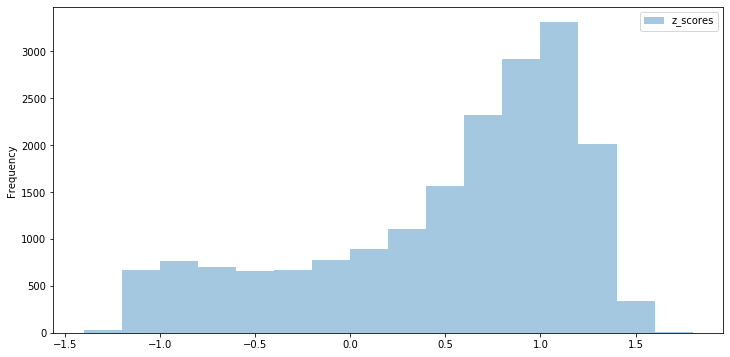

In [181]:
bin_values=np.arange(start=-1.4, stop=2, step=0.2)
hist_plot=avg_dups.plot(kind='hist', bins=bin_values, figsize=[12,6], alpha=.4, legend=True)

In [184]:
fig=hist_plot.get_figure()
fig.savefig("myplot.pdf")

In [187]:
type(avg_dups['z_scores'])

pandas.core.series.Series

In [6]:
avg_dups_df=avg_dups['z_scores'].to_frame()

In [11]:
avg_dups_df["z_scores"]

ids
1.0            0.781803
2.0            0.953275
9.0            0.578716
10.0           0.242485
12.0          -1.010053
                 ...   
114108587.0    1.222529
114483833.0    1.118883
114483834.0    1.123082
114841035.0    0.508661
114841037.0    1.084234
Name: z_scores, Length: 18733, dtype: float64

In [13]:
avg_dups_df.index

Float64Index([        1.0,         2.0,         9.0,        10.0,        12.0,
                     13.0,        14.0,        15.0,        16.0,        18.0,
              ...
              112577516.0, 112694756.0, 113455421.0, 113523636.0, 113523638.0,
              114108587.0, 114483833.0, 114483834.0, 114841035.0, 114841037.0],
             dtype='float64', name='ids', length=18733)

In [15]:
type(avg_dups_df)

pandas.core.frame.DataFrame

In [17]:
avg_dups_df.columns = ['zscore']

In [22]:
avg_dups_df.index

1.0

In [7]:
avg_dups_df.to_csv("id_avgz.csv")

In [4]:
top_75={}
bottom_25={}
import csv
with open("id_avgz.csv","r") as iar:
    csv_reader=csv.reader(iar, delimiter=',')
    next(csv_reader,None)
    for row in csv_reader:
        gene_id=float(row[0])
        zscore=float(row[1])
        if zscore > 1.11651151:
            top_75[gene_id]=zscore
        elif zscore < -0.91304122:
            bottom_25[gene_id]=zscore
        else:
            pass
print(top_75.values())
top = [ int(x) for x in top_75.keys() ]
bottom = [ int(x) for x in bottom_25.keys() ]

dict_values([1.214833143939394, 1.1815097674418606, 1.144044014388489, 1.161521379310345, 1.210629485094851, 1.3399156666666667, 1.1471710555555557, 1.4609170833333334, 1.2432555555555556, 1.2757769298245616, 1.2472236363636364, 1.1711833333333335, 1.3778753658536589, 1.2994498762626263, 1.1444856540084387, 1.3516266183574877, 1.3635951421188635, 1.1799281897435896, 1.185659427272727, 1.433351056910569, 1.3801283333333334, 1.1334443529411762, 1.1965666666666668, 1.3524044444444445, 1.202933484848485, 1.3792594047619047, 1.4304897222222221, 1.1817720833333334, 1.40664, 1.2811777777777775, 1.2100033333333333, 1.3808057777777778, 1.1498802564102564, 1.1902341025641026, 1.2898722222222223, 1.2296423809523809, 1.2389844444444447, 1.162330625, 1.211988484848485, 1.236180192307693, 1.390527328431372, 1.3088229761904764, 1.3686236666666665, 1.4036523449612408, 1.199575, 1.2741451999999995, 1.144251423809524, 1.1347247777777778, 1.1208908333333332, 1.3644535519713261, 1.248381982658959, 1.30855

In [19]:
top

[18,
 19,
 25,
 26,
 32,
 35,
 53,
 56,
 72,
 91,
 94,
 97,
 103,
 104,
 109,
 111,
 115,
 118,
 120,
 142,
 155,
 158,
 177,
 187,
 191,
 204,
 210,
 218,
 219,
 224,
 230,
 231,
 239,
 242,
 246,
 247,
 249,
 259,
 271,
 286,
 307,
 310,
 312,
 313,
 314,
 316,
 317,
 318,
 319,
 320,
 321,
 323,
 324,
 334,
 335,
 337,
 338,
 345,
 347,
 350,
 361,
 378,
 379,
 384,
 399,
 405,
 406,
 408,
 417,
 419,
 433,
 434,
 435,
 466,
 467,
 468,
 473,
 517,
 523,
 528,
 534,
 563,
 573,
 586,
 599,
 608,
 611,
 622,
 634,
 636,
 641,
 642,
 643,
 656,
 657,
 660,
 661,
 671,
 701,
 705,
 712,
 713,
 714,
 715,
 716,
 719,
 727,
 731,
 732,
 754,
 766,
 768,
 771,
 779,
 785,
 786,
 788,
 790,
 801,
 813,
 825,
 832,
 842,
 847,
 865,
 867,
 881,
 889,
 894,
 901,
 904,
 916,
 919,
 928,
 929,
 939,
 950,
 951,
 958,
 960,
 966,
 971,
 978,
 988,
 991,
 995,
 996,
 999,
 1003,
 1004,
 1021,
 1027,
 1033,
 1041,
 1048,
 1063,
 1073,
 1084,
 1087,
 1089,
 1101,
 1106,
 1107,
 1111,
 1130,
 1136

In [2]:
with open("top_75.csv","w") as tr:
    wr=csv.writer(tr,delimiter='\n')
    wr.writerow(top)
    
with open("bottom_25.csv","w") as tr1:
    wr1=csv.writer(tr1,delimiter='\n')
    wr1.writerow(bottom)    